<h1>Public Opinion of COVID Policies</h1>
<h2>Using Twitter Sentiment and Policy Data</h2> 

<b>Elena Stein</b>

<h1>Covid Tweets EDA</h1>

<b>The tasks for this EDA are to:</b>
<ol>
<li>Read in the tweets JSON and process</li>
<li>Investigate word use in the text</li>
<li>Look and word use and sentiment over time</li>
<li>Investigate which fields to use for Geographical analysis later on</li>
</ol>

We read in the tweets from the twitter JSON and listen specifically for words related to COVID-19 in English using the listen_tweets.py script. This appends the tweets to the may_tweets.file. Then we flatten the JSON. 
I collected data from four days in May over roughly over a 7 minute window.

In [50]:
import pandas as pd
df = pd.read_csv('tweets_procesed.csv' ,index_col=0)
df.head()

,created_at,text,lang,quoted_status-text,retweeted_status-text,all_text,determined_location
0,Tue May 05 11:14:28 +0000 2020,RT @ASlavitt: BREAKING: The organization Trump...,en,NaN,NaN,RT @ASlavitt: BREAKING: The organization Trump...,"Cocoa, Florida"
1,Tue May 05 11:14:29 +0000 2020,"RT @Therinesky: 11,000 ABS-CBN employees are b...",en,NaN,NaN,"RT @Therinesky: 11,000 ABS-CBN employees are b...",Manila
2,Tue May 05 11:14:29 +0000 2020,RT @MidwivesRCM: Midwives &amp; UK maternity ...,en,NaN,NaN,RT @MidwivesRCM: Midwives &amp; UK maternity ...,"Leeds, England"
3,Tue May 05 11:14:29 +0000 2020,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,en,NaN,NaN,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,"Zachary, LA"
4,Tue May 05 11:14:29 +0000 2020,RT @gtconway3d: I guess we know what keeps the...,en,A group of RINO Republicans who failed badly 1...,NaN,RT @gtconway3d: I guess we know what keeps the...,"Pittsburgh, PA"


We create two functions to find the presence of a word in the tweet

In [51]:
import numpy as np
text_columns = ['text', 'quoted_status-text', 'retweeted_status-text']
in_english = df['lang']=='en'

# function to check the presence of a word
def check_word(word):
    col = ['text', 'quoted_status-text', 'retweeted_status-text']
    in_english = df['lang']=='en'
    word_bol = df[col[0]].str.contains(word, case=False)
    for i in range(1,3):
        try:
            word_bol |= df[col[i]].str.contains(word, case=False)
        except:
            continue
    word_bol &= in_english
    word_percent = (np.sum(word_bol)/df[df['lang']=='en'].shape[0])
    return word_percent

In [52]:
# needed to extract the word boolean series to later count up 
def check_word_bol(word):
    col = ['text', 'quoted_status-text', 'retweeted_status-text']
    in_english = df['lang']=='en'
    word_bol = df[col[0]].str.contains(word, case=False)
    for i in range(1,3):
        try: 
            word_bol |= df[col[i]].str.contains(word, case=False)
        except:
            continue
    word_bol &= in_english
    word_percent = (np.sum(word_bol)/df[df['lang']=='en'].shape[0])*100
    return word_bol

In [ ]:
words = ['recover', 'deaths', 'lockdown', 'PPE']
words_use_frac = list((map(check_word, words)))

import matplotlib.pyplot as plt
import seaborn as sns

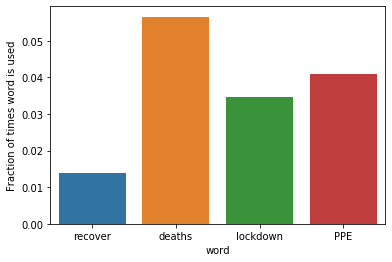

In [58]:
fig = sns.barplot(words,words_use_frac)
plt.ylabel('Fraction of times word is used')
plt.xlabel('word')
plt.savefig('Word_usage.png')

Analysis of a word use over time, limiting the analysis over one day

In [5]:
df.reset_index(inplace=True)
df.columns
df['created_at'] = pd.to_datetime(df['created_at'])
print(df['created_at'].head())

0   2020-05-05 11:14:28+00:00
1   2020-05-05 11:14:29+00:00
2   2020-05-05 11:14:29+00:00
3   2020-05-05 11:14:29+00:00
4   2020-05-05 11:14:29+00:00
Name: created_at, dtype: datetime64[ns, UTC]


In [6]:
df = pd.read_csv('may_5_tweets.csv')
df['created_at'] = pd.to_datetime(df['created_at'])
df.set_index('created_at', inplace=True)
df.head()

,text,lang,quoted_status-text,retweeted_status-text,all_text,determined_location,deaths_mention,recovery_mention
created_at,,,,,,,,
2020-05-05 11:14:28+00:00,RT @ASlavitt: BREAKING: The organization Trump...,en,NaN,NaN,RT @ASlavitt: BREAKING: The organization Trump...,"Cocoa, Florida",True,False
2020-05-05 11:14:29+00:00,"RT @Therinesky: 11,000 ABS-CBN employees are b...",en,NaN,NaN,"RT @Therinesky: 11,000 ABS-CBN employees are b...",Manila,False,False
2020-05-05 11:14:29+00:00,RT @MidwivesRCM: Midwives &amp; UK maternity ...,en,NaN,NaN,RT @MidwivesRCM: Midwives &amp; UK maternity ...,"Leeds, England",False,False
2020-05-05 11:14:29+00:00,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,en,NaN,NaN,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,"Zachary, LA",False,False
2020-05-05 11:14:29+00:00,RT @gtconway3d: I guess we know what keeps the...,en,A group of RINO Republicans who failed badly 1...,NaN,RT @gtconway3d: I guess we know what keeps the...,"Pittsburgh, PA",False,False


In [7]:
print(df.index.max())
print(df.index.min())
# we have only 7 minutes worth of data

2020-05-05 11:21:24+00:00
2020-05-05 11:14:28+00:00


Investigating the use of the word "recovery" versus "death" over time

In [ ]:
df['deaths_mention']=check_word_bol('death')
df['recovery_mention']= check_word_bol('recovery')

mean_death = df['deaths_mention'].resample('1 min').mean()
mean_recover = df['recovery_mention'].resample('1 min').mean()

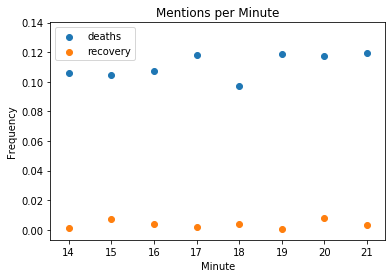

In [8]:
plt.scatter(mean_death.index.minute, mean_death)
plt.scatter(mean_recover.index.minute, mean_recover)
plt.xlabel('Minute')
plt.ylabel('Frequency')
plt.title('Mentions per Minute')
plt.legend(('deaths', 'recovery'))
plt.show()

In [9]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid  = SentimentIntensityAnalyzer()
sentiment_score_text = df['text'].apply(sid.polarity_scores)  

#we need this to extract only the compound sentiment score, which goes from -1 to 1 and tells us how negative or positive the tweet is 
sentiment = sentiment_score_text.apply(lambda x: x['compound'])
print(df[sentiment > 0.7].values[0])
# printing a positive tweet
print(df[sentiment < -0.7].values[0])
# printing a negative tweet

["RT @Z_Everson: President's hotel eligible for $37,000 COVID-19 relief grant from D.C.'s taxpayer-funded convention authority\n\nvia @1100penn…"
 'en' nan nan
 "RT @Z_Everson: President's hotel eligible for $37,000 COVID-19 relief grant from D.C.'s taxpayer-funded convention authority\n\nvia @1100penn…"
 'DC' False False]
["RT @galendruke: Lots to talk about on today's podcast:\n\n-Where we are in the COVID-19 crisis\n-How Dems are reacting to the Biden assault al…"
 'en' nan nan
 "RT @galendruke: Lots to talk about on today's podcast:\n\n-Where we are in the COVID-19 crisis\n-How Dems are reacting to the Biden assault al…"
 'United States' False False]


Looking at sentiment over time for the 6th of May

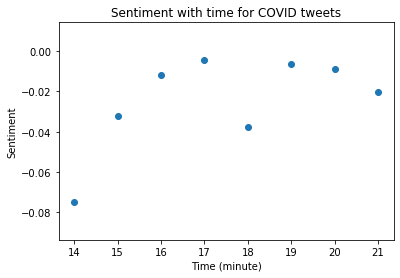

In [10]:
sentiment_covid = sentiment.resample('1 min').mean()
plt.scatter(sentiment_covid.index.minute, sentiment_covid, )
plt.xlabel('Time (minute)')
plt.ylabel('Sentiment')
plt.title('Sentiment with time for COVID tweets')
plt.show()

We could extend this analysis over several days or measure sentiment as a policy change is put into place

The percentage of real user location data from places is too low to be worth using for later analysis, so we will use the determined_location instead for geographical analysis

<h1>Time Series Analysis of Policy Data</h1>

This analysis investigates the evolution of Stringency Index in different countries over time, with the death rate. 
For information of how it is calculated see the link https://covidtracker.bsg.ox.ac.uk, we use the API data instead of the csv files.

<b>Tasks:</b>
<ol>
    <li>Fill the df with json data</li>
    <li>Plot deaths and the stringency index over time for March and April</li>
    <li>Plot selected countries to see the affect of death toll on stringency</li>
</ol>

Retrieving the json from the API

In [11]:
import requests, json
# we are going to request only data from April and March from the OXFORD policy tracker API
url = 'https://covidtrackerapi.bsg.ox.ac.uk/api/stringency/date-range/2020-03-01/2020-04-24'
r = requests.get(url)
json_data = r.json()

In [12]:
import pandas as pd
df= pd.DataFrame(json_data['data'])
df.head()

# we have to flatten the json, to extract each country date entry
data = json_data['data']
time_series = []

for d in data:
    for c in data[d]:
        time_series.append(data[d][c])


In [13]:
df_test = pd.DataFrame(time_series)
df_test.head()

,date_value,country_code,confirmed,deaths,stringency_actual,stringency,stringency_legacy,stringency_legacy_disp
0,2020-03-01,AFG,1.0,0.0,19.05,19.05,23.81,23.81
1,2020-03-01,ARE,21.0,0.0,16.27,16.27,19.29,19.29
2,2020-03-01,AUS,26.0,1.0,19.44,19.44,22.86,22.86
3,2020-03-01,AUT,10.0,0.0,11.11,11.11,14.29,14.29
4,2020-03-01,AZE,1.0,0.0,19.44,19.44,22.86,22.86


We take a list of countries and plot the deaths vs stringency over time

In [14]:
df_test['date_value'] = pd.to_datetime(df_test['date_value'])
countries = ['GBR','SWE','ESP','DEU','ITA','CHN','USA']
df_selected = df_test[df_test['country_code'].isin(countries)]

(18322, 18376)

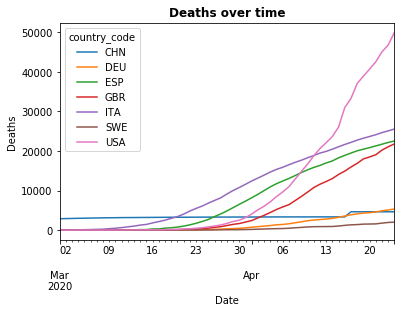

In [15]:
import matplotlib.pyplot as plt
df_pivot = df_selected.pivot(index='date_value', columns='country_code', values=['stringency','deaths'])
df_pivot.plot(y='deaths')
plt.title('Deaths over time', fontweight='semibold')
plt.xlabel('Date')
plt.ylabel('Deaths')
plt.xlim('2020-03-01','2020-04-24')

Text(0.5, 1.0, 'Stringency over time')

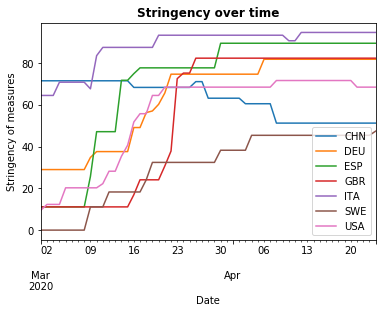

In [16]:
df_pivot.plot(y='stringency')
plt.xlabel('Date')
plt.ylabel('Stringency of measures')
plt.xlim('2020-03-01','2020-04-24')
plt.legend(loc=4)
plt.title('Stringency over time', fontweight='bold')

From this plot we can see that sweden can be highlighted as a case of increasing stringency of policy measures more gradually


In [17]:
df_pivot.index = pd.to_datetime(df_pivot.index)

Here we plot stringency and deaths side by side, to compare how countries reacted to the death toll 

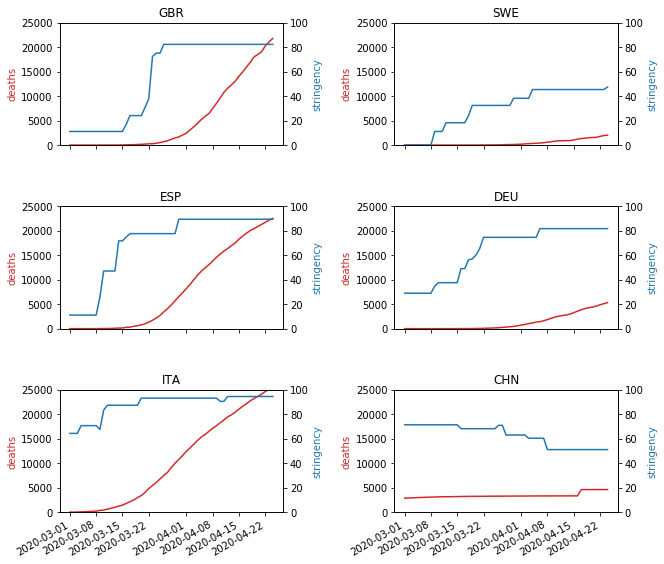

In [43]:
# comparing only European countries plus china
eur = countries[:-1]
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for ax, country in zip(axes.flatten(), eur):
    color = 'tab:red'
    ax.set_title(country)
    ax.plot(df_pivot['deaths',country],color=color, label='deaths')
    ax.set_ylabel('deaths', color=color)
    ax.tick_params(axis='y', )
    ax2 = ax.twinx()  
    ax.set_ylim(0,25000)
    
    color = 'tab:blue'
    ax2.set_ylabel('stringency', color=color)  
    ax2.plot(df_pivot['stringency', country],color=color,label='stringency')
    ax2.tick_params(axis='y')
    ax2.set_ylim(0,100)
fig.autofmt_xdate()
plt.savefig('Deaths_vs_Policy_by_Country.png')

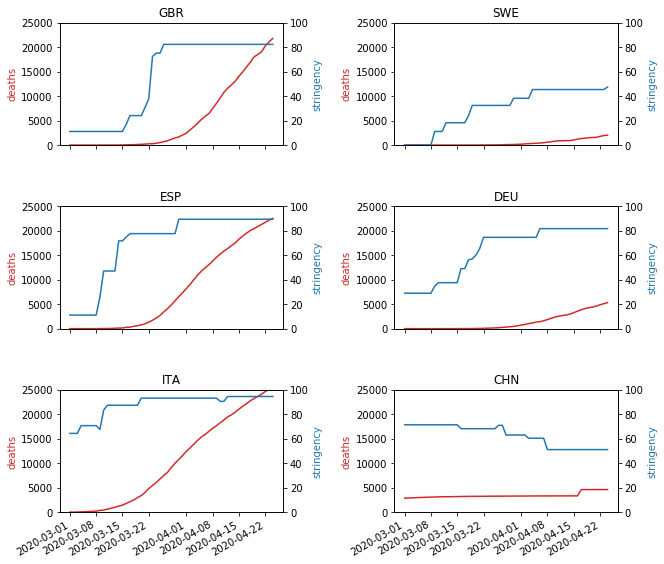

In [45]:
fig

<h1>Geographical Analysis of Policy Data</h1>

<b>Tasks:</b>
<ol>
<li>Investigate the completeness of the data set, to identify how much missing data there is</li>
<li>Convert the date to datetime values</li>
<li>Convert the data to a geopanda to plot on a map</li>
<li>Plot a Chloropleth of the Stringency Index by country for a particular day</li>

In [19]:
import pandas as pd
import geopandas as gpd
url1 = 'https://raw.githubusercontent.com/OxCGRT/covid-policy-tracker/master/data/OxCGRT_latest.csv'
url2 = 'https://raw.githubusercontent.com/OxCGRT/covid-policy-tracker/master/data/OxCGRT_latest_withnotes.csv'
latest = pd.read_csv(url1)
latest.head()

,CountryName,CountryCode,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,...,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
0,Aruba,ABW,20200101,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
1,Aruba,ABW,20200102,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2,Aruba,ABW,20200103,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
3,Aruba,ABW,20200104,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
4,Aruba,ABW,20200105,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0


This is analysis to identify where there is most missing data

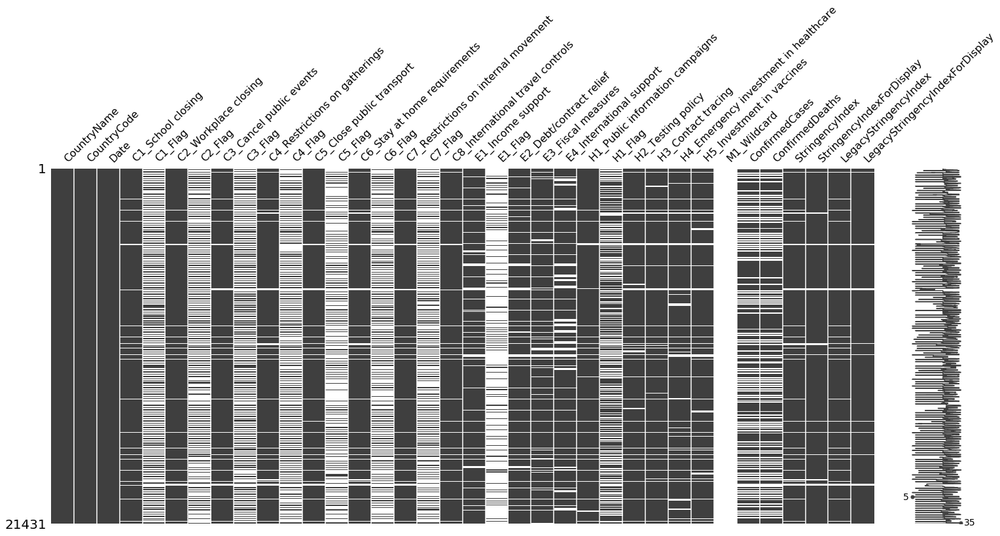

In [20]:
import missingno as msno
msno.matrix(latest)

We convert the date column to a date time

In [21]:
def convert_date(date):
    num = date
    year = num[0:4]
    month = num[4:6]
    day = num[6:8]
    return str(year+"-"+month+"-"+day)

In [22]:
latest['Date'] = latest['Date'].apply(lambda x: convert_date(str(x)))
latest['Date']=pd.to_datetime(latest['Date'])
latest.head()

,CountryName,CountryCode,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,...,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
0,Aruba,ABW,2020-01-01,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
1,Aruba,ABW,2020-01-02,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2,Aruba,ABW,2020-01-03,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
3,Aruba,ABW,2020-01-04,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
4,Aruba,ABW,2020-01-05,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0


We import country polygons from geopandas

In [23]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


We rename the column Country Code to iso_a3 so that we can merge the geopandas with the latest dataframe

In [24]:
latest.rename(columns={'CountryCode':'iso_a3'}, inplace=True)

We select a date in april for which there is less null value

In [25]:
latest_april = latest[latest['Date']=='2020-03-10']
latest_april.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160 entries, 79 to 21377
Data columns (total 36 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   CountryName                            160 non-null    object        
 1   iso_a3                                 160 non-null    object        
 2   Date                                   160 non-null    datetime64[ns]
 3   C1_School closing                      159 non-null    float64       
 4   C1_Flag                                140 non-null    float64       
 5   C2_Workplace closing                   158 non-null    float64       
 6   C2_Flag                                99 non-null     float64       
 7   C3_Cancel public events                158 non-null    float64       
 8   C3_Flag                                140 non-null    float64       
 9   C4_Restrictions on gatherings          158 non-null    float64

In [26]:
latest_april.head()

,CountryName,iso_a3,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,...,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
79,Aruba,ABW,2020-03-20,3.0,1.0,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,4.0,0.0,30.56,30.56,37.14,37.14
213,Afghanistan,AFG,2020-03-20,3.0,1.0,0.0,NaN,2.0,1.0,0.0,...,1.0,0.0,0.0,NaN,22.0,0.0,36.11,36.11,45.71,45.71
347,Angola,AGO,2020-03-20,0.0,NaN,0.0,NaN,0.0,NaN,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,11.11,11.11,11.43,11.43
481,Albania,ALB,2020-03-20,3.0,1.0,2.0,0.0,2.0,1.0,2.0,...,1.0,25000000.0,0.0,NaN,70.0,2.0,84.39,84.39,85.24,85.24
615,Andorra,AND,2020-03-20,3.0,1.0,3.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,NaN,75.0,0.0,35.18,35.18,45.24,45.24


In [27]:
latest_april.set_index('iso_a3', inplace=True)
latest_april.head()

,CountryName,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,...,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
iso_a3,,,,,,,,,,,,,,,,,,,,,
ABW,Aruba,2020-03-20,3.0,1.0,0.0,NaN,0.0,NaN,0.0,NaN,...,0.0,0.0,0.0,NaN,4.0,0.0,30.56,30.56,37.14,37.14
AFG,Afghanistan,2020-03-20,3.0,1.0,0.0,NaN,2.0,1.0,0.0,NaN,...,1.0,0.0,0.0,NaN,22.0,0.0,36.11,36.11,45.71,45.71
AGO,Angola,2020-03-20,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,...,0.0,0.0,0.0,NaN,NaN,NaN,11.11,11.11,11.43,11.43
ALB,Albania,2020-03-20,3.0,1.0,2.0,0.0,2.0,1.0,2.0,1.0,...,1.0,25000000.0,0.0,NaN,70.0,2.0,84.39,84.39,85.24,85.24
AND,Andorra,2020-03-20,3.0,1.0,3.0,1.0,1.0,1.0,0.0,NaN,...,0.0,0.0,0.0,NaN,75.0,0.0,35.18,35.18,45.24,45.24


We create the GeoDataFrame so that we can plot the data using folium

In [28]:
map_april =world.merge(latest_april, on='iso_a3')
map_april.set_index('iso_a3', inplace=True)
map_april.head()

,pop_est,continent,name,gdp_md_est,geometry,CountryName,Date,C1_School closing,C1_Flag,C2_Workplace closing,...,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
iso_a3,,,,,,,,,,,,,,,,,,,,,
TZA,53950935,Africa,Tanzania,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",Tanzania,2020-03-20,3.0,1.0,0.0,...,1.0,0.0,0.0,NaN,3.0,0.0,34.13,34.13,31.43,31.43
CAN,35623680,North America,Canada,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,2020-03-20,3.0,1.0,3.0,...,1.0,562.0,191.0,NaN,846.0,10.0,74.74,74.74,72.86,72.86
USA,326625791,North America,United States of America,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",United States,2020-03-20,3.0,0.0,3.0,...,1.0,0.0,0.0,NaN,14250.0,150.0,64.44,64.44,68.10,68.10
KAZ,18556698,Asia,Kazakhstan,460700.0,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",Kazakhstan,2020-03-20,3.0,1.0,0.0,...,0.0,0.0,0.0,NaN,49.0,0.0,76.20,76.20,74.52,74.52
UZB,29748859,Asia,Uzbekistan,202300.0,"POLYGON ((55.96819 41.30864, 55.92892 44.99586...",Uzbekistan,2020-03-20,3.0,1.0,2.0,...,2.0,52356020.0,0.0,NaN,23.0,0.0,60.85,60.85,74.52,74.52


We plot a historgram of the frequencies of each stringency level for the countries we have data.

Text(0.5, 0, 'Stringeny Index')

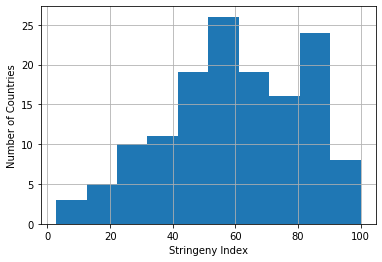

In [29]:
ax = map_april['StringencyIndexForDisplay'].hist()
ax.set_ylabel('Number of Countries')
ax.set_xlabel('Stringeny Index')

We plot the Stringency Index of each country on a map, shaded according to the level of Stringency

In [48]:
import folium
from folium import Choropleth, Circle, Marker
m = folium.Map(location=[30,0], zoom_start=2)
Choropleth(geo_data=map_april['geometry'].__geo_interface__,
           data=map_april['StringencyIndexForDisplay'],
           key_on='feature.id', 
           fill_color='BuPu',
           fill_opacity=0.7,
           line_opacity=0.2,
           legend_name='Stringency Index'
          ).add_to(m)

m.save('m.html')
m

In [49]:
m

<h1>Geographical Analysis of Tweets</h1>

<b>Tasks:</b>
<ol>
<li>Import may 5th tweets</li>
<li>Carry out sentiment analysis of the tweets</li>
<li>Geocode the tweets based on user location</li>
<li>Plot them on a map based on Sentiment</li>
</ol>

In [31]:
import pandas as pd
df = pd.read_csv('may_5_tweets.csv')
df.head()

,created_at,text,lang,quoted_status-text,retweeted_status-text,all_text,determined_location,deaths_mention,recovery_mention
0,2020-05-05 11:14:28+00:00,RT @ASlavitt: BREAKING: The organization Trump...,en,NaN,NaN,RT @ASlavitt: BREAKING: The organization Trump...,"Cocoa, Florida",True,False
1,2020-05-05 11:14:29+00:00,"RT @Therinesky: 11,000 ABS-CBN employees are b...",en,NaN,NaN,"RT @Therinesky: 11,000 ABS-CBN employees are b...",Manila,False,False
2,2020-05-05 11:14:29+00:00,RT @MidwivesRCM: Midwives &amp; UK maternity ...,en,NaN,NaN,RT @MidwivesRCM: Midwives &amp; UK maternity ...,"Leeds, England",False,False
3,2020-05-05 11:14:29+00:00,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,en,NaN,NaN,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,"Zachary, LA",False,False
4,2020-05-05 11:14:29+00:00,RT @gtconway3d: I guess we know what keeps the...,en,A group of RINO Republicans who failed badly 1...,NaN,RT @gtconway3d: I guess we know what keeps the...,"Pittsburgh, PA",False,False


Perform sentiment analysis

In [32]:
# perform sentiment analysis for covid tweet
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid  = SentimentIntensityAnalyzer()
sentiment_score_text = df['text'].apply(sid.polarity_scores) 
sentiment = sentiment_score_text.apply(lambda x: x['compound'])

In [33]:
df['sentiment']= sentiment
df.head()

,created_at,text,lang,quoted_status-text,retweeted_status-text,all_text,determined_location,deaths_mention,recovery_mention,sentiment
0,2020-05-05 11:14:28+00:00,RT @ASlavitt: BREAKING: The organization Trump...,en,NaN,NaN,RT @ASlavitt: BREAKING: The organization Trump...,"Cocoa, Florida",True,False,0.0000
1,2020-05-05 11:14:29+00:00,"RT @Therinesky: 11,000 ABS-CBN employees are b...",en,NaN,NaN,"RT @Therinesky: 11,000 ABS-CBN employees are b...",Manila,False,False,-0.6597
2,2020-05-05 11:14:29+00:00,RT @MidwivesRCM: Midwives &amp; UK maternity ...,en,NaN,NaN,RT @MidwivesRCM: Midwives &amp; UK maternity ...,"Leeds, England",False,False,0.0000
3,2020-05-05 11:14:29+00:00,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,en,NaN,NaN,A Storm Is Brewing\n\n#QAnon #WWG1WGA #TheGrea...,"Zachary, LA",False,False,0.0000
4,2020-05-05 11:14:29+00:00,RT @gtconway3d: I guess we know what keeps the...,en,A group of RINO Republicans who failed badly 1...,NaN,RT @gtconway3d: I guess we know what keeps the...,"Pittsburgh, PA",False,False,0.4215


In [34]:
print(df['sentiment'].max(), df['sentiment'].min())

0.9834 -0.9756


Geocode the tweets based on user location description

In [35]:
import math
import geopandas as gpd
from geopandas.tools import geocode

import folium 
from folium import Marker
from folium.plugins import MarkerCluster

In [36]:
df = df.sample(n=5000, random_state=1)

In [37]:
def my_geocoder(row):
    try:
        point = geocode(row, provider='nominatim', ).geometry.iloc[0]
        return pd.Series({'Latitude': point.y, 'Longitude': point.x, 'geometry': point})
    except:
        return None

locations_decoded = df[['determined_location']].apply(lambda x: my_geocoder(x), axis=1)

In [38]:
import numpy as np
print('The percentage of places geocoded is {}'.format(sum(~np.isnan(locations_decoded['Latitude']))*100/len(df)))

The percentage of places geocoded is 66.14


This is a good number to plot on the map although the data is 100% not realiable

In [39]:
locations_decoded.reset_index(inplace=True)
locations_decoded = locations_decoded[locations_decoded['Latitude'].notnull()]
df_with_location = pd.merge(df.reset_index(), locations_decoded, how='right', left_index=True, right_index=True)
df_with_location = gpd.GeoDataFrame(df_with_location, geometry=df_with_location.geometry)
df_with_location.crs = {'init': 'epsg:4326'}
df_with_location.head()

,index_x,created_at,text,lang,quoted_status-text,retweeted_status-text,all_text,determined_location,deaths_mention,recovery_mention,sentiment,index_y,Latitude,Longitude,geometry
0,5633,2020-05-05 11:18:11+00:00,RT @JOYNEWSONTV: (((LIVE: Ministry of Informat...,en,NaN,NaN,RT @JOYNEWSONTV: (((LIVE: Ministry of Informat...,accra,False,False,0.0000,5633,5.560014,-0.205744,POINT (-0.20574 5.56001)
1,5769,2020-05-05 11:18:16+00:00,"RT @nspector4: Basically, the @JustinTrudeau g...",en,Most of Canada’s cases in late February and ea...,NaN,"RT @nspector4: Basically, the @JustinTrudeau g...","Barrie, Ontario",False,False,0.0000,5769,44.389311,-79.690174,POINT (-79.69017 44.38931)
2,2625,2020-05-05 11:16:12+00:00,"COVID-10 cases nearing 100,000 in Iran https:/...",en,NaN,NaN,"COVID-10 cases nearing 100,000 in Iran https:/...",Azerbaijan,False,False,0.0000,2625,40.393629,47.787251,POINT (47.78725 40.39363)
3,2615,2020-05-05 11:16:12+00:00,RT @TeaPainUSA: Tea’s gonna be straight with y...,en,BREAKING: The organization Trump used to proje...,NaN,RT @TeaPainUSA: Tea’s gonna be straight with y...,"Florida, USA",True,False,-0.4588,2615,27.756767,-81.463983,POINT (-81.46398 27.75677)
4,6434,2020-05-05 11:18:43+00:00,RT @ashindestad: You won Britain. Enjoy the de...,en,UK now has highest coronavirus death toll in E...,NaN,RT @ashindestad: You won Britain. Enjoy the de...,"London, England",True,False,0.8648,6434,51.507322,-0.127647,POINT (-0.12765 51.50732)


In [ ]:
df_with_location.to_file('may_tweets_with_location.shp')

Here is a map with the tweets plotted on each location, we can then do some sentiment analysis and we can see 
how it matches to policy stringency data. 

In [40]:
def color_producer(val):
    if val < -0.6:
        return 'red'
    if val > 0.6:
        return 'green'
    else:
        return 'yellow'
 
m_2 = folium.Map(location=[30, 0], zoom_start=2) 

for idx, row in df_with_location.iterrows():
    folium.Circle(location=[row['Latitude'], row['Longitude']], radius=10, 
                  color=color_producer(row['sentiment']), popup=row['text']).add_to(m_2)
m_2.save('m_2.html')
m_2

In [47]:
m_2